# Install PUDL
Until we get our custom Docker image built, the software needs to be installed in your user environment each session. If you are using this notebook on the Catalyst JupyterHub, uncomment the commands in the following cell and run it before anything else.

In [ ]:
#!conda install --yes --quiet python-snappy
#!pip install --quiet git+https://github.com/catalyst-cooperative/pudl.git@dev
#!cp ~/shared/shared-pudl.yml ~/.pudl.yml

# An Introduction to Working with EPA CEMS data

CEMS or <a href='https://www.epa.gov/emc/emc-continuous-emission-monitoring-systems'>**Continusous Emissions Monitoring Systems**</a> are used to track power plant's compliance with EPA emission standards. Among the data are hourly measurements of SO2, CO2, and NOx emissions associated with a given plant. The EPA's <a href='https://www.epa.gov/airmarkets'>Clean Air Markets Division</a> has collected CEMS data stretching back to 1990 and publicized it in their <a href='https://ampd.epa.gov/ampd/'>data portal</a>. Combinging the CEMS data with EIA and FERC data provides access to greater and more specific information about utilities and generation facilities. This notebook provides a glimpse into the analysis potential of CEMS data usage and integration.

**NOTE**: This Notebook presuposes access to the parquet files in which the CEMS data is stored.

# PUDL Notebook Setup

The following packages enable interaction with the CEMS dataset through pudl.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# Standard libraries
import logging
import os
import pathlib
import sys

# 3rd party libraries
import geopandas as gpd
import dask.dataframe as dd
from dask.distributed import Client
import numpy as np
import pandas as pd
import sqlalchemy as sa
import pyarrow

# Local libraries
import pudl

In [3]:
logger=logging.getLogger()
logger.setLevel(logging.INFO)
handler = logging.StreamHandler(stream=sys.stdout)
formatter = logging.Formatter('%(message)s')
handler.setFormatter(formatter)
logger.handlers = [handler]

In [4]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
sns.set()
%matplotlib inline

In [5]:
pudl_settings = pudl.workspace.setup.get_defaults()
#display(pudl_settings)

ferc1_engine = sa.create_engine(pudl_settings['ferc1_db'])
#display(ferc1_engine)

pudl_engine = sa.create_engine(pudl_settings['pudl_db'])
#display(pudl_engine)

#pudl_engine.table_names()
pudl_out = pudl.output.pudltabl.PudlTabl(pudl_engine, freq='AS') #annual frequency

# Bigger Data in Pandas

The CEMS dataset is enormous! It contains hourly operations and emissions data for thousands of power plants between 1995 and 2019. The full dataset is close to a billion rows and takes up 100 GB of space uncompressed, which means it will not all fit in memory on your laptop at the same time. One of the best tools for dealing with larger-than-memory data analysis in Python is the [Dask](https://dask.org) library, which extends Pandas, while maintaining a pretty similiar interface. We'll be using some of Dask's features below to work with this larger dataset.

Additional resources you might want to check out:
* [Scaling Pandas](https://tomaugspurger.github.io/modern-8-scaling.html) is a brief introduction to working with larger datasets using Dask.
* [How to learn Dask in 2020](https://coiled.io/blog/how-to-learn-dask-in-2020/) is a more extensive collection of self-guided educational resources.

We store the EPA CEMS data in [Apache Parquet files](https://parquet.apache.org/), which are optimized for fast reading of individual columns of tabular data. We partition the dataset by state and year, to make it easy to read in only the chunks that you actually need.

One of the main features of Dask is "lazy execution" -- it doesn't read data or do any computation until it has to, or you explicitly tell it to. Instead, it allows you to build of a series of computational instructions, and then it intelligently looks at those instructions and executes them so as to minimize memory utilization and/or parallelize the tasks if possible.

For example, the following cell will "read" in the full EPA CEMS dataset almost instantly... but that's because no data has been read off of disk yet. The instructions for reading off of the disk have been added to the list of things the Dask dataframe will do when you actually as it for a result.

In [24]:
epacems_path = pathlib.Path(pudl_settings["parquet_dir"]) / "epacems"
epacems_dd = dd.read_parquet(epacems_path)

However, some information about the dataframe is available at this point -- including the names of the columns and their data types -- because that information is stored in the Parquet file metadata:

In [25]:
epacems_dd.dtypes

plant_id_eia                               int32
unitid                                    string
operating_datetime_utc       datetime64[ns, UTC]
operating_time_hours                     float32
gross_load_mw                            float32
steam_load_1000_lbs                      float32
so2_mass_lbs                             float32
so2_mass_measurement_code               category
nox_rate_lbs_mmbtu                       float32
nox_rate_measurement_code               category
nox_mass_lbs                             float32
nox_mass_measurement_code               category
co2_mass_tons                            float32
co2_mass_measurement_code               category
heat_content_mmbtu                       float32
facility_id                                Int32
unit_id_epa                                Int32
state                                   category
year                                    category
dtype: object

If you want to know anything about the contents of the data itself, some data will have to be read in, and some computation performed. Before any aggregations or calculations or selections have happened, you can ask how many rows there are in the whole parquet dataset, and it will be returned relatively quickly, since that information is also stored in the metadata. This would behave differently later on, since after you've told the dataframe to do some computation, you'd be asking for the length of the **result of that computation** not the original inputs.

In [26]:
%%time
len(epacems_dd)

CPU times: user 24.5 s, sys: 1.43 s, total: 25.9 s
Wall time: 15.7 s


791223000

# Analyzing a Subset of EPA CEMS Data

One strategy for working with a large dataset is to only look at small subsets of it in any given analysis.

You can point Dask at a large parquet dataset like EPA CEMS and tell it to read in only a subset of the columns, and the select a subset of the rows based on some criteria of interest. So long as the collection of rows and columns you've specified end up being smaller than the available memory on you computer, this operation will succeed. However, depending on how fast your disk is, it may still take longer than you would like.

## Simple Filtering
The following statement will tell Dask where the dataset is, and describe a subset of the data that should be returned as a pandas dataframe (only data about power plants in Colorado in 2019). This should be small enough to fit in memory, but it won't actually read the data in yet:

In [43]:
slow_epacems_dd = (
    dd.read_parquet(epacems_path)
    .query("year==2019")
    .query("state=='CO'")
)

If we're satisfied that this is the data we want, then we can go ahead and ask Dask to read it in and give us a pandas dataframe back. This will allows us to search through a billion rows of data on disk and select only the small subset that we are interested in without blowing up our memory usage. This is very flexible -- you can select on whatever criteria you want -- but it's not very efficient. It will still take maybe 5 minutes on a laptop with a fast SSD (uncomment it if you want to actually give this a try...):

In [44]:
#%%time
#slow_epacems_df = slow_epacems_dd.compute()

## Filter using Parquet partitions
To make operations like this faster and easier, we have pre-partitioned the EPA CEMS Parquet dataset by `state` and `year` -- there's a separate parquet file that contains each state's data for each year, in a directory structure that many tools for working with Parquet files understand. This means you can tell Dask that there are only certain files it needs to look in for the data you're interested in. Rather than scanning through 100 GB of data across 1300 different files, it can just read data from the single file that contains the 2019 data for Colorado. On a computer with a fast SSD, this should takes about a fraction of a second:

In [45]:
%%time
epacems_dd = dd.read_parquet(
    epacems_path,
    filters=[[("state", "=", "CO"), ("year", "=", 2019)]],
)
epacems_df = epacems_dd.compute()
epacems_df.sample(10)

CPU times: user 455 ms, sys: 111 ms, total: 566 ms
Wall time: 611 ms


,plant_id_eia,unitid,operating_datetime_utc,operating_time_hours,gross_load_mw,steam_load_1000_lbs,so2_mass_lbs,so2_mass_measurement_code,nox_rate_lbs_mmbtu,nox_rate_measurement_code,nox_mass_lbs,nox_mass_measurement_code,co2_mass_tons,co2_mass_measurement_code,heat_content_mmbtu,facility_id,unit_id_epa,state,year
77884,50707,S003,2019-02-09 11:00:00+00:00,0.67,6.0,NaN,0.039000,Measured,0.278,Measured,17.844000,Calculated,3.819000,Measured,64.185997,8291,90507,CO,2019
589980,6761,F,2019-12-01 19:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,875,90256,CO,2019
29944,55127,CT1,2019-01-08 23:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1286,3958,CO,2019
364952,470,2,2019-08-31 15:00:00+00:00,1.00,252.0,NaN,313.700012,Measured,0.161,Measured,428.212006,Calculated,278.899994,Measured,2659.699951,80,300,CO,2019
15584,6112,5,2019-01-30 15:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,821,90254,CO,2019
243059,55453,4,2019-05-27 18:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1493,4793,CO,2019
376483,6112,5,2019-08-16 02:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,821,90254,CO,2019
36987,55453,2,2019-01-23 10:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1493,4791,CO,2019
70867,6761,C,2019-02-25 02:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,875,8364,CO,2019
578589,525,H2,2019-12-23 04:00:00+00:00,1.00,143.0,NaN,176.600006,Measured,0.051,Measured,74.500999,Calculated,149.899994,Measured,1460.800049,85,318,CO,2019


### A Partition Filtering Shortcut
Unfortunately, the nested list of lists of boolean predicates used to specify the filters (known as [disjunctive normal form](https://en.wikipedia.org/wiki/Disjunctive_normal_form) is a little unwieldy, so we have some helper functions that can construct them for you. `pudl.output.epacems.year_state_filter()` will give you a filter that selects the data for all combinations of the years and states you specify:

In [46]:
demo_filter = pudl.output.epacems.year_state_filter(years=[2018, 2019], states=["CO", "CA"])
demo_filter

[[('year', '=', 2018), ('state', '=', 'CO')],
 [('year', '=', 2018), ('state', '=', 'CA')],
 [('year', '=', 2019), ('state', '=', 'CO')],
 [('year', '=', 2019), ('state', '=', 'CA')]]

In [47]:
%%time
epacems_dd = dd.read_parquet(
    epacems_path,
    filters=demo_filter
)
epacems_df = epacems_dd.compute()
epacems_df.sample(10)

CPU times: user 3.69 s, sys: 1.07 s, total: 4.76 s
Wall time: 3.55 s


,plant_id_eia,unitid,operating_datetime_utc,operating_time_hours,gross_load_mw,steam_load_1000_lbs,so2_mass_lbs,so2_mass_measurement_code,nox_rate_lbs_mmbtu,nox_rate_measurement_code,nox_mass_lbs,nox_mass_measurement_code,co2_mass_tons,co2_mass_measurement_code,heat_content_mmbtu,facility_id,unit_id_epa,state,year
69395,6761,A,2019-02-19 18:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,875,8360,CO,2019
780674,10405,1,2018-05-03 10:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,8337,90775,CA,2018
52910,6013,01,2018-01-04 22:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,784,2677,CA,2018
583043,7315,4,2019-04-24 19:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,951,90502,CA,2019
2057847,50864,1,2018-12-21 23:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,8190,89974,CA,2018
870761,57073,BLR1,2018-05-06 01:00:00+00:00,1.00,0.0,NaN,0.100,LME,0.011,Calculated,2.400,LME,13.000000,LME,220.699997,8306,90614,CA,2018
259136,55217,X724,2018-02-08 16:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1344,4153,CA,2018
1566775,56041,M2,2018-09-10 15:00:00+00:00,1.00,36.0,NaN,0.173,Measured,0.007,Measured,2.021,Calculated,17.200001,Measured,288.700012,8113,89632,CA,2018
711428,260,3A,2018-06-01 04:00:00+00:00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,47,150,CA,2018
1608233,57483,GT-1,2018-09-28 01:00:00+00:00,0.12,3.0,NaN,0.012,Measured,0.033,Measured,0.405,Calculated,0.732000,Measured,12.264000,8322,90692,CA,2018


## Limiting columns
Often you will only be interested in a certain subset of the columns stored in a parquet dataset. Parquet files are organized internally to make it very efficient to only select certain columns, and the `read_parquet()` method makes this easy. Say you're only interested in power outputs, fuel consumed, and CO2 emissions, but not traditional air pollutants:

In [48]:
%%time
ghg_cols = [
    "state",
    "year",
    "operating_datetime_utc",
    "plant_id_eia",
    "facility_id",
    "unit_id_epa",
    "unitid",
    "operating_time_hours",
    "gross_load_mw",
    "heat_content_mmbtu",
    "co2_mass_tons",
]
epacems_dd = dd.read_parquet(
    epacems_path,
    filters=demo_filter,
    columns=ghg_cols,
)
epacems_df = epacems_dd.compute()
epacems_df.sample(10)

CPU times: user 2.8 s, sys: 654 ms, total: 3.45 s
Wall time: 2.85 s


,state,year,operating_datetime_utc,plant_id_eia,facility_id,unit_id_epa,unitid,operating_time_hours,gross_load_mw,heat_content_mmbtu,co2_mass_tons
18940,CA,2018,2018-01-15 12:00:00+00:00,345,62,228,2,0.0,0.0,0.000000,NaN
999747,CA,2019,2019-06-14 11:00:00+00:00,55951,8046,89370,AMP-1,0.0,0.0,0.000000,NaN
1380331,CA,2018,2018-08-02 03:00:00+00:00,55963,7704,88362,1,1.0,41.0,419.200012,24.900000
592188,CA,2019,2019-04-15 20:00:00+00:00,10294,7214,8434,2,0.0,0.0,0.000000,NaN
1839407,CA,2018,2018-11-22 07:00:00+00:00,399,71,266,14,0.0,0.0,0.000000,NaN
1300675,CA,2018,2018-08-31 03:00:00+00:00,400,72,89433,9,1.0,245.0,1671.199951,97.500000
213116,CO,2019,2019-05-20 03:00:00+00:00,525,85,317,H1,1.0,121.0,1339.300049,137.399994
1325309,CA,2018,2018-08-03 13:00:00+00:00,10294,7214,8434,2,0.0,0.0,0.000000,NaN
547074,CO,2019,2019-11-12 01:00:00+00:00,55127,1286,3958,CT1,1.0,117.0,1333.199951,79.199997
1690247,CA,2019,2019-11-01 07:00:00+00:00,55510,1530,4917,GT-1,0.0,0.0,0.000000,NaN


## Combining these selection tools
We can combine these methods to select a small subset of the large dataset very quickly. Let's just load data related to Xcel Energy's Comanche coal plant in Colorado. Since the EPA CEMS data only contains the EIA Plant ID, we need to look that up first.

In [50]:
comanche_colorado = (
    pudl_out.plants_eia860()
    .query("plant_name_eia=='Comanche'")
    .query("state=='CO'")
    .loc[:,["report_date", "plant_id_eia", "plant_name_eia", "utility_id_eia", "city", "state"]]
    .merge(pudl_out.utils_eia860()[["utility_id_eia", "utility_name_eia", "report_date"]])
)
comanche_colorado

,report_date,plant_id_eia,plant_name_eia,utility_id_eia,city,state,utility_name_eia
0,2019-01-01,470,Comanche,15466,Pueblo,CO,Public Service Co of Colorado
1,2018-01-01,470,Comanche,15466,Pueblo,CO,Public Service Co of Colorado
2,2017-01-01,470,Comanche,15466,Pueblo,CO,Public Service Co of Colorado
3,2016-01-01,470,Comanche,15466,Pueblo,CO,Public Service Co of Colorado
4,2015-01-01,470,Comanche,15466,Pueblo,CO,Public Service Co of Colorado
5,2014-01-01,470,Comanche,15466,Pueblo,CO,Public Service Co of Colorado
6,2013-01-01,470,Comanche,15466,Pueblo,CO,Public Service Co of Colorado
7,2012-01-01,470,Comanche,15466,Pueblo,CO,Public Service Co of Colorado
8,2011-01-01,470,Comanche,15466,Pueblo,CO,Public Service Co of Colorado
9,2010-01-01,470,Comanche,15466,Pueblo,CO,Public Service Co of Colorado


Based on the above, we can see that Comanche has `plant_id_eia == 470` and we already know that it's in Colorado. So let's load all the years of data from Colorado, but only for Comanche, and calculate these additional values
* Gross Generation (MWh)
* Heat Rate (mmBTU / MWh)
* Gross CO2 intensity (tons / MWh)

In [51]:
%%time
only_colorado = pudl.output.epacems.year_state_filter(states=["CO"])
comanche_dd = (
    dd.read_parquet(
        epacems_path,
        filters=only_colorado,
        columns=ghg_cols,
    )
    .query("plant_id_eia==470")
)
comanche_df = (
    comanche_dd.compute()
    .assign(
        gross_generation_mwh=lambda x: x.operating_time_hours * x.gross_load_mw,
        heat_rate_mmbtu_mwh=lambda x: x.heat_content_mmbtu / x.gross_generation_mwh,
        gross_co2_intensity=lambda x: x.co2_mass_tons / x.gross_generation_mwh
    )
)
comanche_df.sample(10)

CPU times: user 5.03 s, sys: 358 ms, total: 5.39 s
Wall time: 4 s


,state,year,operating_datetime_utc,plant_id_eia,facility_id,unit_id_epa,unitid,operating_time_hours,gross_load_mw,heat_content_mmbtu,co2_mass_tons,gross_generation_mwh,heat_rate_mmbtu_mwh,gross_co2_intensity
436451,CO,2013,2013-09-24 18:00:00+00:00,470,80,89734,3,0.0,0.0,0.000000,NaN,0.0,NaN,NaN
430106,CO,2016,2016-09-20 09:00:00+00:00,470,80,299,1,1.0,254.0,2445.800049,256.500000,254.0,9.629134,1.009843
309885,CO,2011,2011-07-26 04:00:00+00:00,470,80,300,2,1.0,349.0,3523.199951,361.899994,349.0,10.095129,1.036963
74740,CO,2000,2000-04-24 11:00:00+00:00,470,<NA>,<NA>,1,0.0,0.0,0.000000,NaN,0.0,NaN,NaN
301865,CO,2001,2001-11-22 00:00:00+00:00,470,80,299,1,1.0,349.0,3788.399902,388.700012,349.0,10.855014,1.113754
164559,CO,2013,2013-04-17 22:00:00+00:00,470,80,89734,3,1.0,756.0,7173.700195,752.400024,756.0,9.489021,0.995238
284385,CO,2003,2003-08-31 16:00:00+00:00,470,<NA>,<NA>,1,1.0,354.0,3533.699951,362.600006,354.0,9.982203,1.024294
302535,CO,2001,2001-11-19 22:00:00+00:00,470,80,300,2,1.0,361.0,3520.399902,361.200012,361.0,9.751801,1.000554
474374,CO,2009,2009-11-02 21:00:00+00:00,470,80,299,1,1.0,160.0,1592.800049,167.100006,160.0,9.955000,1.044375
145417,CO,2000,2000-07-17 08:00:00+00:00,470,<NA>,<NA>,2,1.0,195.0,2305.300049,236.500000,195.0,11.822052,1.212821


This has selected almost 500,000 rows and 50 MB of data out of ~1 billion rows and ~100 GB in a few seconds:

In [52]:
comanche_df.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 490848 entries, 6696 to 573599
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype              
---  ------                  --------------   -----              
 0   state                   490848 non-null  category           
 1   year                    490848 non-null  category           
 2   operating_datetime_utc  490848 non-null  datetime64[ns, UTC]
 3   plant_id_eia            490848 non-null  int32              
 4   facility_id             329040 non-null  Int32              
 5   unit_id_epa             329040 non-null  Int32              
 6   unitid                  490848 non-null  string             
 7   operating_time_hours    490564 non-null  float32            
 8   gross_load_mw           490848 non-null  float32            
 9   heat_content_mmbtu      490848 non-null  float32            
 10  co2_mass_tons           426750 non-null  float32            
 11  gross_generation_mwh   

## Visualizing Plant Operations Through Time
Now that we've got a managable dataframe, we can visualize what's inside it! Here's the heat content of the fuel consumed each hour for the last 25 years in the three Comanche coal units.

### Fuel Consumption

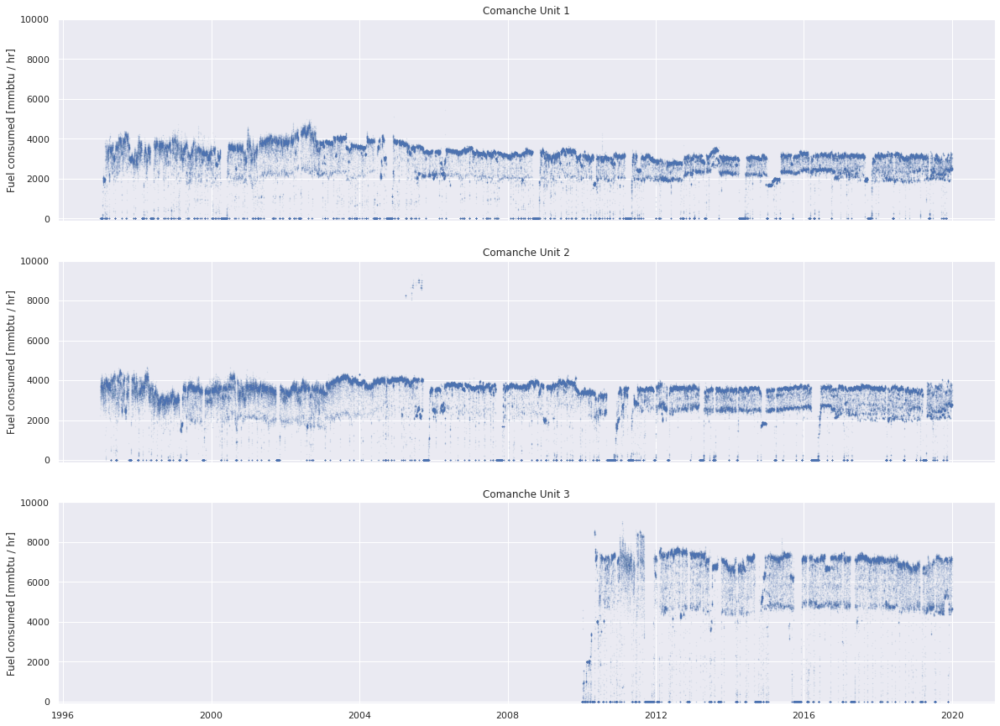

In [53]:
unit_ids = comanche_df.unitid.unique()
fig, axs = plt.subplots(nrows=len(unit_ids), ncols=1, sharex=True, figsize=(20,15))
for n, unitid in enumerate(comanche_df.unitid.unique()):
    axs[n].scatter(
        comanche_df.query("unitid==@unitid").operating_datetime_utc,
        comanche_df.query("unitid==@unitid").heat_content_mmbtu,
        s=0.2, alpha=0.1,
    )
    axs[n].set_ylim(-100,10_000)
    axs[n].set_title(f"Comanche Unit {unitid}")
    axs[n].set_ylabel("Fuel consumed [mmbtu / hr]")
plt.show();

### Heat Rate

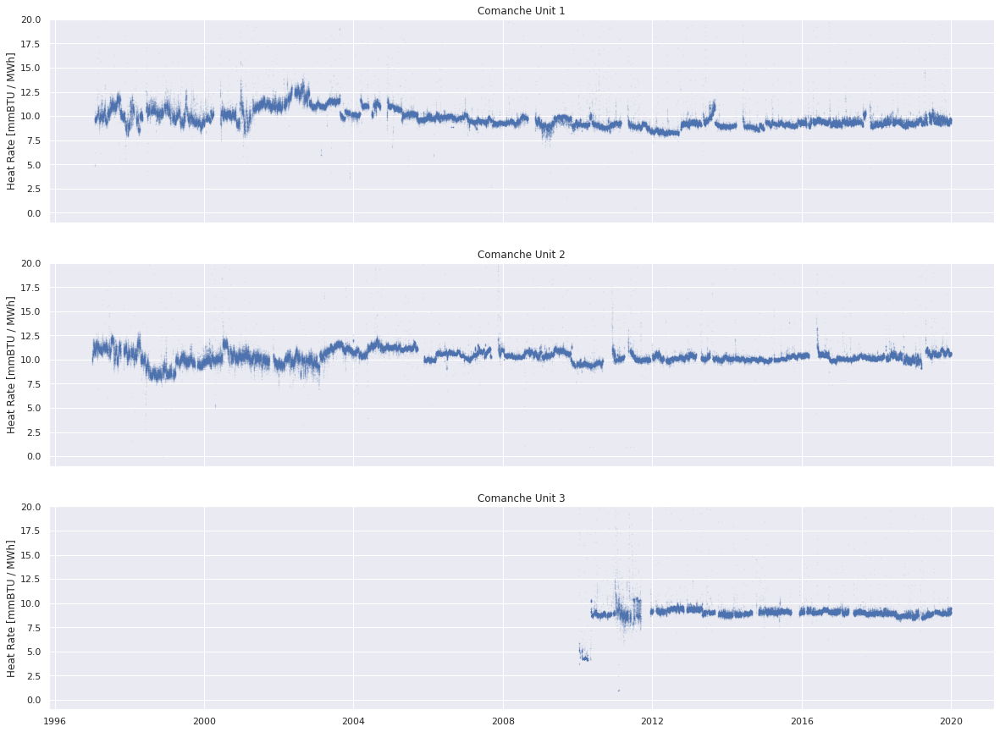

In [54]:
unit_ids = comanche_df.unitid.unique()
fig, axs = plt.subplots(nrows=len(unit_ids), ncols=1, sharex=True, figsize=(20,15))
for n, unitid in enumerate(comanche_df.unitid.unique()):
    axs[n].scatter(
        comanche_df.query("unitid==@unitid").operating_datetime_utc,
        comanche_df.query("unitid==@unitid").heat_rate_mmbtu_mwh,
        s=0.2, alpha=0.1,
    )
    axs[n].set_ylim(-1,20)
    axs[n].set_title(f"Comanche Unit {unitid}")
    axs[n].set_ylabel("Heat Rate [mmBTU / MWh]")
plt.show();

### Carbon Intensity

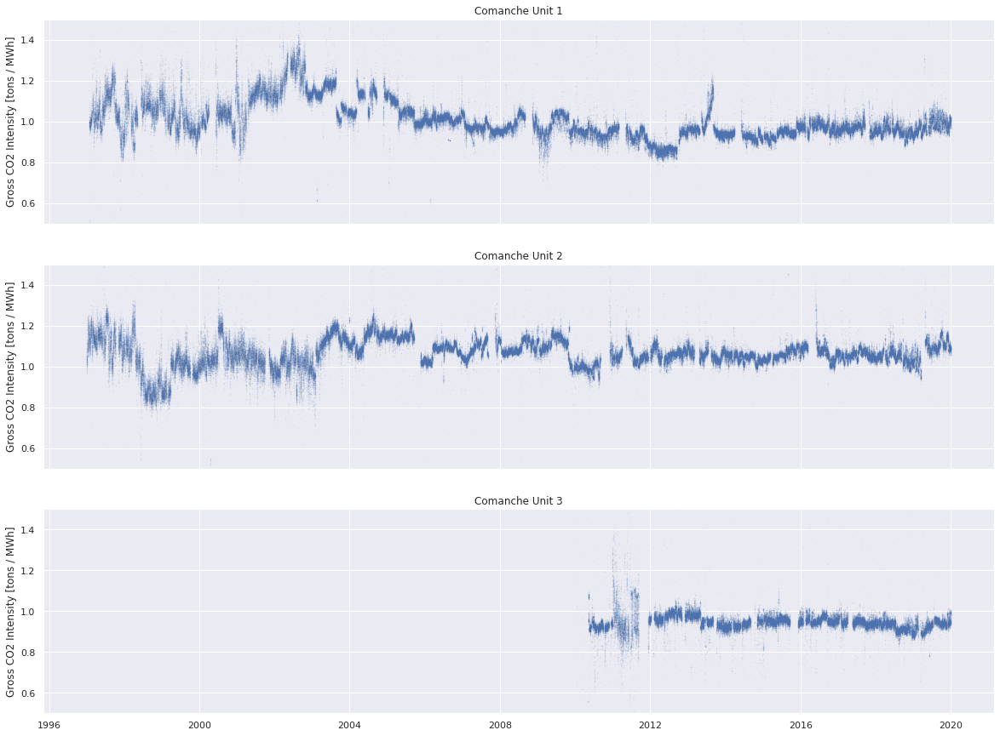

In [55]:
unit_ids = comanche_df.unitid.unique()
fig, axs = plt.subplots(nrows=len(unit_ids), ncols=1, sharex=True, figsize=(20,15))
for n, unitid in enumerate(comanche_df.unitid.unique()):
    axs[n].scatter(
        comanche_df.query("unitid==@unitid").operating_datetime_utc,
        comanche_df.query("unitid==@unitid").gross_co2_intensity,
        s=0.2, alpha=0.1,
    )
    axs[n].set_ylim(0.5,1.5)
    axs[n].set_title(f"Comanche Unit {unitid}")
    axs[n].set_ylabel("Gross CO2 Intensity [tons / MWh]")
plt.show();

### Gross Load

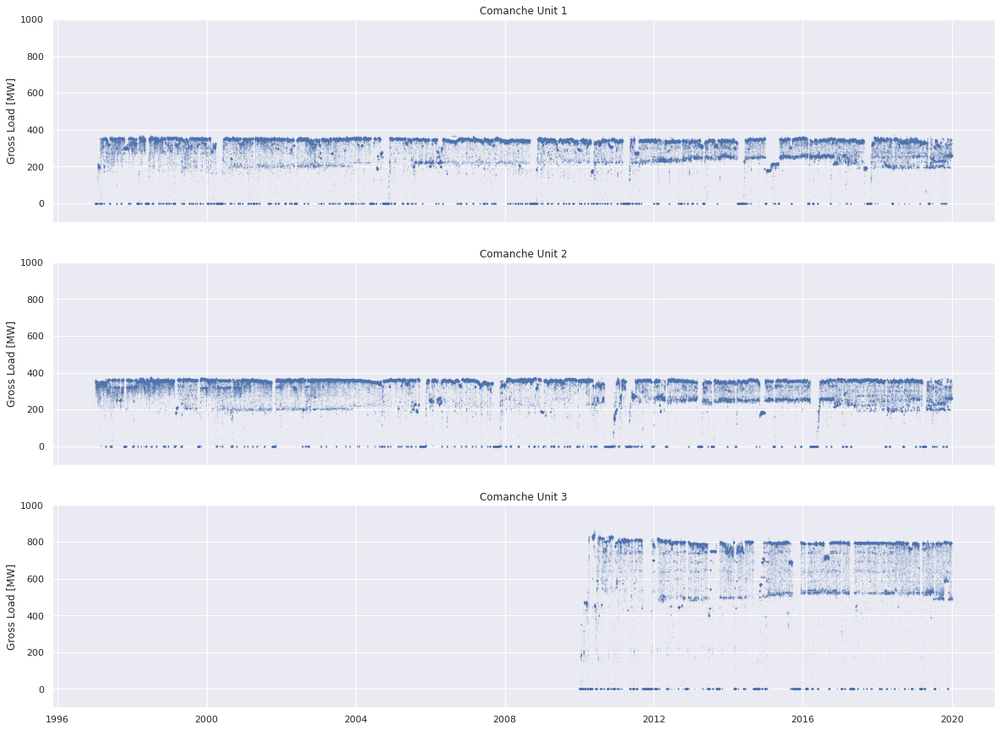

In [56]:
unit_ids = comanche_df.unitid.unique()
fig, axs = plt.subplots(nrows=len(unit_ids), ncols=1, sharex=True, figsize=(20,15))
for n, unitid in enumerate(comanche_df.unitid.unique()):
    axs[n].scatter(
        comanche_df.query("unitid==@unitid").operating_datetime_utc,
        comanche_df.query("unitid==@unitid").gross_load_mw,
        s=0.2, alpha=0.1,
    )
    axs[n].set_ylim(-100,1000)
    axs[n].set_title(f"Comanche Unit {unitid}")
    axs[n].set_ylabel("Gross Load [MW]")
plt.show();

# Aggregating / Downsampling EPA CEMS Data

Rather than selecting a small subset of a large dataset at its full resolution, we can aggregate records to reduce large datasets to a managable size. Now that you know what's available, you can pick the columns you'd like to work with, and aggregate rows if necessary. 

**Note** that in CEMS the `state` and `measurement_code` columns are categorical datatypes, meaning that they will overwhelm your computer's memory if included in the list of columns you'd like to groupby. In pandas, this is solved by including the statement `observed=True` in the groupby, but with Dask we'll solve this by changing the datatype to string. As mentioned previously, the dataset is very large. If the Dask dataframe you construct is too similar to the original dataset -- imagine the example below without the `groupby` -- the client will be unable to load it in pandas. The dataset below should load in a couple of minutes.

## Comparing Plant-level Emissions for Two Years

In [57]:
%%time
# Prepare CEMS data

# A list of the columns you'd like to include in your analysis
my_cols = [
    'year',
    'plant_id_eia', 
    'unitid',
    'so2_mass_lbs',
    'nox_mass_lbs',
    'co2_mass_tons'
]

# Select emissions data are grouped by state, plant_id and unit_id
# Remember to change the datatype for 'state' from category to string
my_cems_dd = (
    dd.read_parquet(epacems_path, columns=my_cols)
    .astype({
        'year': int,
    })
    .groupby(['year', 'plant_id_eia'])[[
        'so2_mass_lbs',
        'nox_mass_lbs',
        'co2_mass_tons'
    ]]
    .sum()
).reset_index()
cems_byplant = my_cems_dd.compute()

CPU times: user 7min 8s, sys: 38.5 s, total: 7min 47s
Wall time: 6min 4s


In [58]:
# Prepare EIA data for integration with CEMS
plants_df = (
    pudl_out.plants_eia860()
    .loc[:, ["plant_id_eia", "report_date", "plant_name_eia", "state", "longitude", "latitude" ]]
    .assign(year=lambda x: x.report_date.dt.year)
    .drop("report_date", axis="columns")
    .pipe(pudl.helpers.oob_to_nan, ["latitude"], lb=-90.0, ub=90.0)
    .pipe(pudl.helpers.oob_to_nan, ["longitude"], lb=-180.0, ub=180.0)
    .dropna()
    .query("state not in ('AK', 'HI')")
    .query("latitude < 50.0")
)

# Merge EIA plant data with CEMS aggregated plant data
merged_cems_df = (
    plants_df.merge(
        cems_byplant,
        on=["year", "plant_id_eia"],
        how="inner",
    )
)

# Make a geodataframe for mapping out of the merged plant data
cems_gdf = (
    gpd.GeoDataFrame(
        merged_cems_df,
        geometry=gpd.points_from_xy(merged_cems_df.longitude, merged_cems_df.latitude),
        crs="EPSG:4326",  # Geographic coordinates: Latitude / Longitude in degrees.
    )
    .drop(["latitude", "longitude"], axis="columns")
    .to_crs("EPSG:3857")
)
cems_gdf.sample(5)

,plant_id_eia,plant_name_eia,state,year,so2_mass_lbs,nox_mass_lbs,co2_mass_tons,geometry
9008,10377,James River Cogeneration,VA,2009,4.041553e+06,1.965956e+06,608060.562500,POINT (-8601623.658 4480152.216)
9956,50707,TCP 272,CO,2016,2.733078e+03,4.033349e+05,270591.875000,POINT (-11663343.801 4880280.925)
14538,56177,Nebo Power Station,UT,2019,1.928911e+03,5.513557e+04,191032.703125,POINT (-12437659.915 4874868.776)
5804,4125,Manitowoc,WI,2016,5.253454e+05,1.512962e+05,222106.078125,POINT (-9757799.021 5478140.654)
8280,7967,Lordsburg Generating,NM,2015,1.432980e+02,2.541536e+04,14189.745117,POINT (-12100204.897 3809408.965)


In [59]:
cems_gdf[cems_gdf['year']==2009]

,plant_id_eia,plant_name_eia,state,year,so2_mass_lbs,nox_mass_lbs,co2_mass_tons,geometry
10,3,Barry,AL,2009,7.421863e+07,1.688174e+07,1.142486e+07,POINT (-9797261.781 3633645.272)
21,7,Gadsden,AL,2009,7.851693e+06,1.590670e+06,3.657224e+05,POINT (-9570225.679 4030520.883)
32,8,Gorgas,AL,2009,1.005530e+07,1.074673e+07,5.695994e+06,POINT (-9706668.420 3981145.507)
43,9,Copper,TX,2009,1.314490e+02,4.794882e+04,0.000000e+00,POINT (-11841610.833 3731442.106)
54,10,Greene County,AL,2009,6.320896e+07,8.759257e+06,2.606754e+06,POINT (-9771747.353 3842554.853)
...,...,...,...,...,...,...,...,...
15083,56629,Waterbury Generation,CT,2009,4.948750e+02,1.174953e+04,1.998640e+04,POINT (-8130964.851 5092975.216)
15094,56639,Starwood Power Midway LLC,CA,2009,2.016080e+02,6.527695e+03,2.016985e+04,POINT (-13422873.810 4391003.777)
15114,56674,Winchester Power Park,TX,2009,3.053350e+02,1.164870e+04,3.023431e+04,POINT (-10796599.113 3508448.184)
15149,56803,Panoche Energy Center,CA,2009,1.081210e+03,3.982159e+04,1.079800e+05,POINT (-13423271.554 4390627.194)


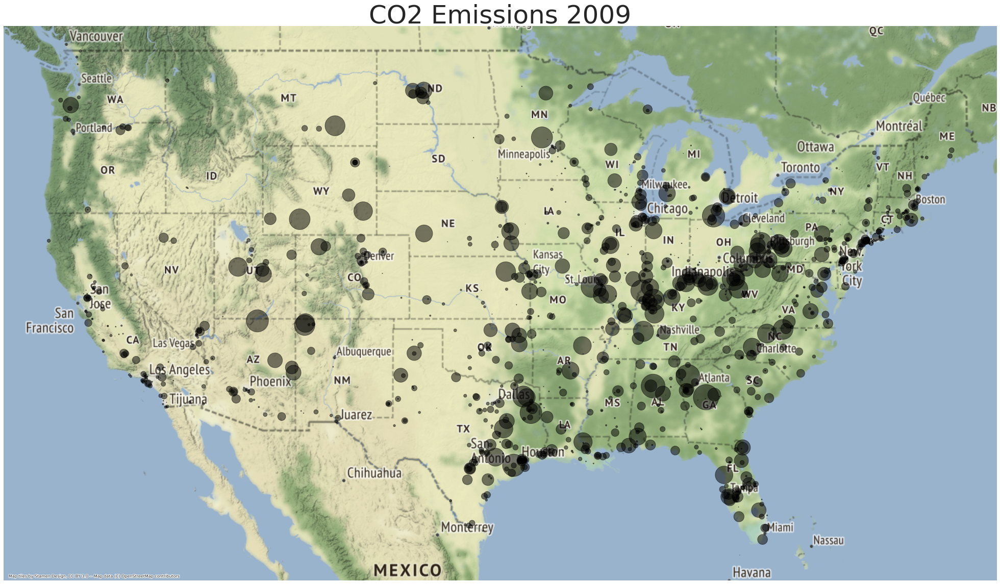

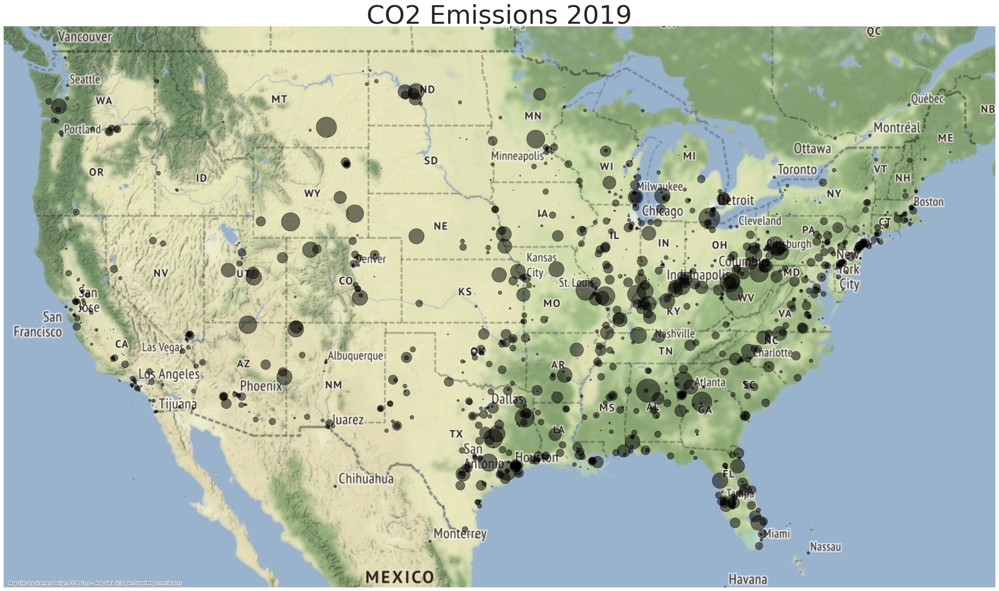

In [61]:
def map_point_source_emissions(gdf, year, states=None, scaling=1e4, alpha=0.25):
    """Map of emissions by plant coordinates in proportion to their annual amount."""
    import contextily as ctx
    gdf_to_plot = gdf.query("year==@year")
    if states is not None:
        gdf_to_plot = gdf_to_plot[gdf_to_plot.state.isin(states)]
        
    ax = gdf_to_plot.plot(
        figsize=(40,20),
        color="black",
        alpha=alpha,
        markersize=gdf_to_plot.co2_mass_tons / scaling,
    )
    ax.set_title(f'CO2 Emissions {year}', fontsize=50)
    ax.set_axis_off()
    ctx.add_basemap(ax)
    
    return ax

map_point_source_emissions(cems_gdf, 2009, states=None, scaling=1e4, alpha=0.5)
map_point_source_emissions(cems_gdf, 2019, states=None, scaling=1e4, alpha=0.5);

Now lets take a look at the difference. Of the plants that opperated both in 2009 and 2019, the red shows where there was an increase in CO2 emissions and the green shows where there was a decrease in CO2 emissions.

/home/zane/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/geopandas/geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)
/home/zane/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/zane/miniconda3/envs/pudl-dev/lib/python3.8/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


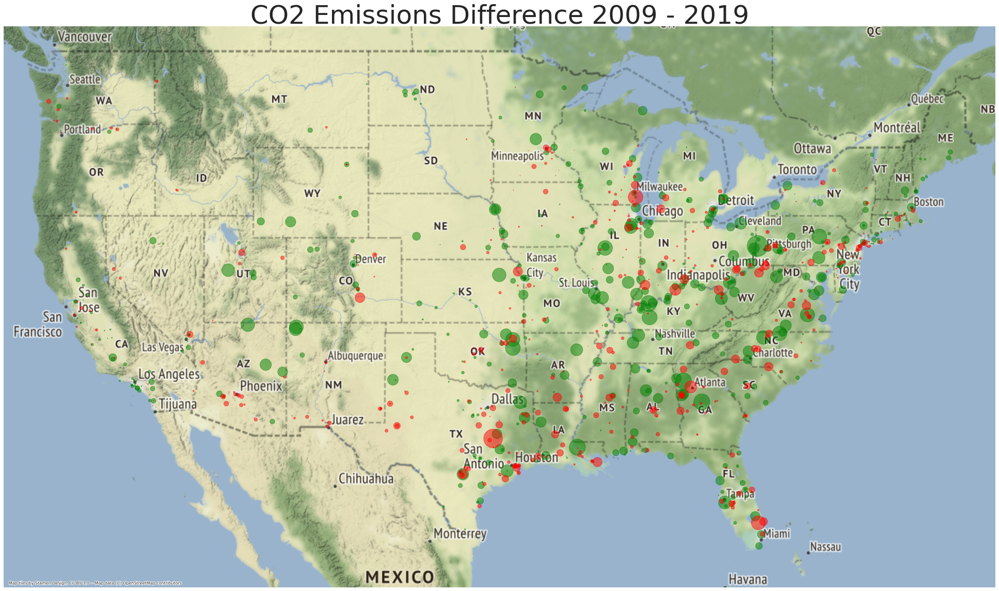

In [64]:
def calculate_emissions_difference(df):
    """Calculate the difference in emission between two years"""
    df['year_diff'] = (
        df.groupby('plant_id_eia')['co2_mass_tons']
        .diff()
    )
    df = df.dropna()

    #pos_df = df[df['co2_mass_tons']>0].copy()
    pos_df = df.loc[df.co2_mass_tons>=0]
    neg_df = (
        df.loc[df.year_diff<0]
        .assign(year_diff=lambda x: abs(x.year_diff))
    )
    
    return pos_df, neg_df

def map_emissions_difference(gdf, year_old, year_new, states=None, scaling=1e4, alpha=0.25):
    """Map of emissions by plant coordinates in proportion to their annual amount."""
    import contextily as ctx
    gdf_to_plot = gdf.query("year==[@year_old, @year_new]")
    if states is not None:
        gdf_to_plot = gdf_to_plot[gdf_to_plot.state.isin(states)]
        
    # Calculate emissions difference between years    
    pos_df, neg_df = calculate_emissions_difference(gdf_to_plot)
    
    # Plot figure
    fig, ax = plt.subplots(figsize=(40, 20))
    pos_df.plot(
        ax=ax,
        color="green",
        alpha=alpha,
        markersize=pos_df.year_diff / scaling,
    )
    neg_df.plot(
        ax=ax,
        color="red",
        alpha=alpha,
        markersize=neg_df.year_diff / scaling,
    )
    ax.set_axis_off()
    ax.set_title(f'CO2 Emissions Difference {year_old} - {year_new}', fontsize=50)
    ctx.add_basemap(ax)
    plt.show()
        
    return plt.show()

map_emissions_difference(cems_gdf, 2009, 2019, states=None, scaling=1e4, alpha=0.5)
